# BICCN MOUSE BRAIN DATA 
Comparing 10xv3 cell, 10xv2 cell, 10xv3 nuclei and 10xv2 nuclei

In [2]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
# Control warnings
import warnings; warnings.simplefilter('ignore')

import os
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

import torch
import anndata

import plotly.express as px
import plotly.graph_objects as go

import plotly.express as px
import plotly.graph_objects as go
from anndata import AnnData
from umap import UMAP
from fastTSNE import TSNE
import plotnine as p
import datetime 
from fastTSNE.callbacks import ErrorLogger

import scvi
scvi.__version__


'0.7.0a6'

In [3]:
adata = anndata.read('./adatas/biccn.h5ad')


In [4]:
adata.obs

,cluster_id,cluster_label,subclass_label,class_label,cluster_color,size,aggr_num,umi.counts,gene.counts,library_id,...,method,exp_component_name,mapped_reads,unmapped_reads,nonconf_mapped_reads,total.reads,doublet.score,sample_type,sample_type_tech,batch
index,,,,,,,,,,,,,,,,,,,,,
AAACCCAAGCTTCATG-1L8TX_181211_01_G12-0,42,L5 IT Tcap_2,L5 IT,Glutamatergic,#52CA74,17334,1,55812,7122,L8TX_181211_01_G12,...,10xv3,AAACCCAAGCTTCATG-1L8TX_181211_01_G12,141238.0,2460,11355,155053.0,0.154639,cells,scv3,0
AAACCCAAGGCGCTTC-1L8TX_181211_01_G12-0,0,unlabeled,unlabeled,unlabeled,#000000,0,1,1670,668,L8TX_181211_01_G12,...,10xv3,AAACCCAAGGCGCTTC-1L8TX_181211_01_G12,4160.0,64,1049,5273.0,0.030928,cells,scv3,0
AAACCCAAGGCTTAAA-1L8TX_181211_01_G12-0,0,unlabeled,unlabeled,unlabeled,#000000,0,1,1873,406,L8TX_181211_01_G12,...,10xv3,AAACCCAAGGCTTAAA-1L8TX_181211_01_G12,6404.0,47,2539,8990.0,0.000000,cells,scv3,0
AAACCCAAGTGAGGTC-1L8TX_181211_01_G12-0,41,L5 IT Tcap_1,L5 IT,Glutamatergic,#5DDB65,7462,1,36622,6125,L8TX_181211_01_G12,...,10xv3,AAACCCAAGTGAGGTC-1L8TX_181211_01_G12,90968.0,1351,7997,100316.0,0.163265,cells,scv3,0
AAACCCACACCAGCCA-1L8TX_181211_01_G12-0,42,L5 IT Tcap_2,L5 IT,Glutamatergic,#52CA74,17334,1,90475,8322,L8TX_181211_01_G12,...,10xv3,AAACCCACACCAGCCA-1L8TX_181211_01_G12,240181.0,4107,20590,264878.0,0.164948,cells,scv3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCATCGGATGTT-8L8TX_180420_01_D01-3,23,L2/3 IT,L2/3 IT,Glutamatergic,#6F836B,18607,8,3739,1982,SM-H4RNA-4,...,10Xv2,TTTGTCATCGGATGTT-8L8TX_180420_01_D01,41858.0,2512,4156,48526.0,0.000000,nuclei,snv2,3
TTTGTCATCGTCTGAA-8L8TX_180420_01_D01-3,11,Vip Crispld2,Vip,GABAergic,#992E81,388,8,1671,1091,SM-H4RNA-4,...,10Xv2,TTTGTCATCGTCTGAA-8L8TX_180420_01_D01,19613.0,1239,2172,23024.0,0.000000,nuclei,snv2,3
TTTGTCATCTGGTGTA-8L8TX_180420_01_D01-3,33,L6 CT,L6 CT,Glutamatergic,#338C5E,12704,8,4498,2337,SM-H4RNA-4,...,10Xv2,TTTGTCATCTGGTGTA-8L8TX_180420_01_D01,54094.0,3341,5690,63125.0,0.140000,nuclei,snv2,3


In [8]:
ad.obs.T

index,AAACCCAAGCTTCATG-1L8TX_181211_01_G12-0,AAACCCAAGGCGCTTC-1L8TX_181211_01_G12-0,AAACCCAAGGCTTAAA-1L8TX_181211_01_G12-0,AAACCCAAGTGAGGTC-1L8TX_181211_01_G12-0,AAACCCACACCAGCCA-1L8TX_181211_01_G12-0,AAACCCACAGCTCGGT-1L8TX_181211_01_G12-0,AAACCCAGTGAACGGT-1L8TX_181211_01_G12-0,AAACCCAGTGGCATCC-1L8TX_181211_01_G12-0,AAACCCAGTTAAGGAT-1L8TX_181211_01_G12-0,AAACCCAGTTTGCAGT-1L8TX_181211_01_G12-0,...,TTTGTTGCACATGGTT-1L8TX_181211_01_G12-0,TTTGTTGCACCTCTGT-1L8TX_181211_01_G12-0,TTTGTTGCATGGCACC-1L8TX_181211_01_G12-0,TTTGTTGGTACGTAGG-1L8TX_181211_01_G12-0,TTTGTTGGTAGTGTGG-1L8TX_181211_01_G12-0,TTTGTTGGTGTATTCG-1L8TX_181211_01_G12-0,TTTGTTGGTGTTCCAA-1L8TX_181211_01_G12-0,TTTGTTGGTTCCAGGC-1L8TX_181211_01_G12-0,TTTGTTGTCGCAATTG-1L8TX_181211_01_G12-0,TTTGTTGTCTCGAGTA-1L8TX_181211_01_G12-0
cluster_id,42,0,0,41,42,0,41,20,98,0,...,61,125,61,43,60,83,42,0,0,42
cluster_label,L5 IT Tcap_2,unlabeled,unlabeled,L5 IT Tcap_1,L5 IT Tcap_2,unlabeled,L5 IT Tcap_1,Vip Gpc3,Sst Myh8_1_low,unlabeled,...,L6 CT Cpa6_2,L5 IT S100b_1_low,L6 CT Cpa6_2,L5 IT S100b,L6 CT Cpa6_1,Lamp5 Pdlim5_2_low,L5 IT Tcap_2,unlabeled,unlabeled,L5 IT Tcap_2
subclass_label,L5 IT,unlabeled,unlabeled,L5 IT,L5 IT,unlabeled,L5 IT,Vip,Low Quality,unlabeled,...,L6 CT,Low Quality,L6 CT,L5 IT,L6 CT,Low Quality,L5 IT,unlabeled,unlabeled,L5 IT
class_label,Glutamatergic,unlabeled,unlabeled,Glutamatergic,Glutamatergic,unlabeled,Glutamatergic,GABAergic,Low Quality,unlabeled,...,Glutamatergic,Low Quality,Glutamatergic,Glutamatergic,Glutamatergic,Low Quality,Glutamatergic,unlabeled,unlabeled,Glutamatergic
cluster_color,#52CA74,#000000,#000000,#5DDB65,#52CA74,#000000,#5DDB65,#B09FFF,#FF9F2C,#000000,...,#409463,#5BA861,#409463,#00CF1E,#338C5E,#785164,#52CA74,#000000,#000000,#52CA74
size,17334,0,0,7462,17334,0,7462,314,300,0,...,5986,423,5986,4272,5854,227,17334,0,0,17334
aggr_num,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
umi.counts,55812,1670,1873,36622,90475,122401,98226,74567,11397,1211,...,72010,16978,52646,87764,55344,19838,43258,642,767,117610
gene.counts,7122,668,406,6125,8322,9426,8681,8081,2783,792,...,7929,3736,6855,8179,7114,4114,6686,423,429,9071
library_id,L8TX_181211_01_G12,L8TX_181211_01_G12,L8TX_181211_01_G12,L8TX_181211_01_G12,L8TX_181211_01_G12,L8TX_181211_01_G12,L8TX_181211_01_G12,L8TX_181211_01_G12,L8TX_181211_01_G12,L8TX_181211_01_G12,...,L8TX_181211_01_G12,L8TX_181211_01_G12,L8TX_181211_01_G12,L8TX_181211_01_G12,L8TX_181211_01_G12,L8TX_181211_01_G12,L8TX_181211_01_G12,L8TX_181211_01_G12,L8TX_181211_01_G12,L8TX_181211_01_G12


 ======================== 10xv3 cells 9733 droplets, library: L8TX_181211_01_G12 ==============================
Sampling from binomial...: 100%|██████████| 20000/20000 [00:01<00:00, 10685.33it/s]
 ======================== 10xv3 cells 22108 droplets, library: L8TX_181211_01_H12 ==============================
Sampling from binomial...: 100%|██████████| 20000/20000 [00:01<00:00, 10711.13it/s]
 ======================== 10xv3 cells 8965 droplets, library: L8TX_181211_01_A01 ==============================
Sampling from binomial...: 100%|██████████| 20000/20000 [00:01<00:00, 10529.98it/s]
 ======================== 10xv3 cells 11869 droplets, library: L8TX_181211_01_B01 ==============================
Sampling from binomial...: 100%|██████████| 20000/20000 [00:01<00:00, 10595.13it/s]
 ======================== 10xv3 cells 25378 droplets, library: L8TX_181211_01_C01 ==============================
Sampling from binomial...: 100%|██████████| 20000/20000 [00:01<00:00, 10760.46it/s]
 ================

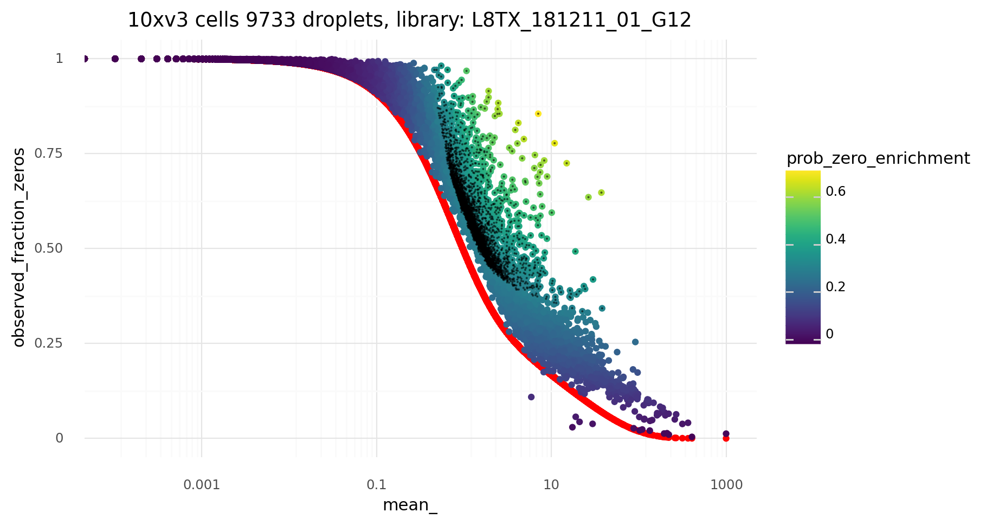

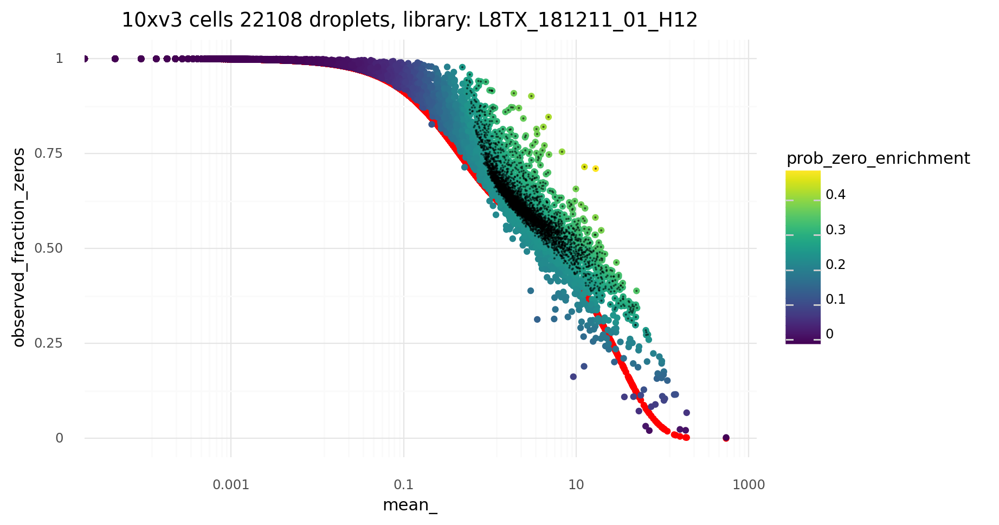

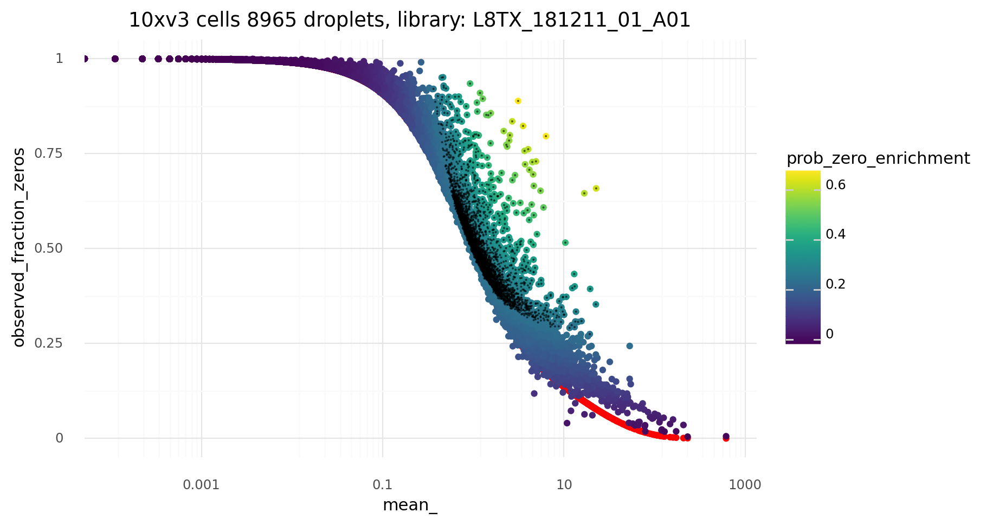

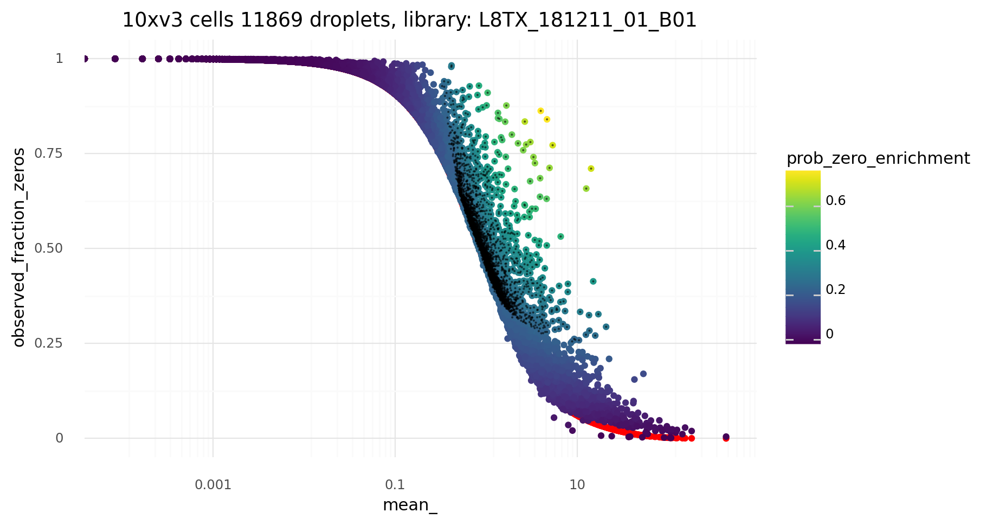

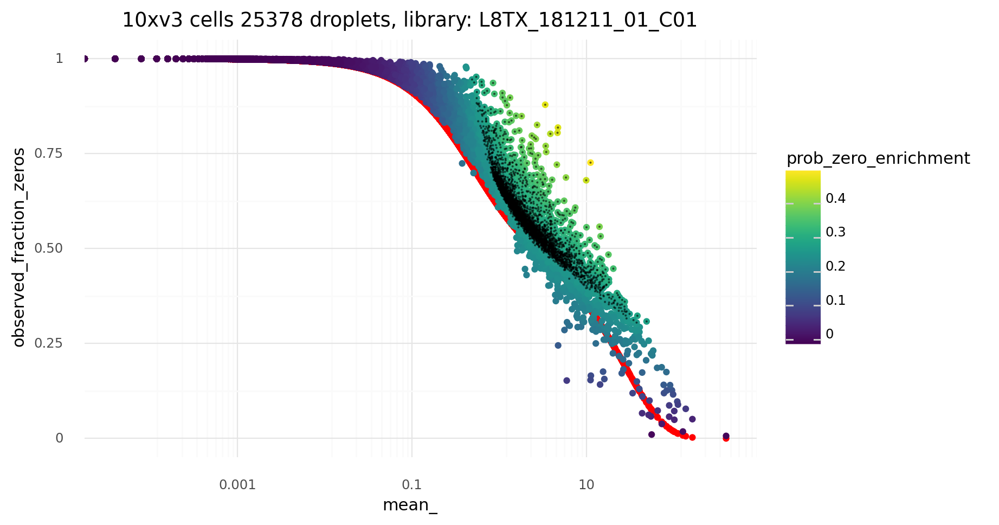

...

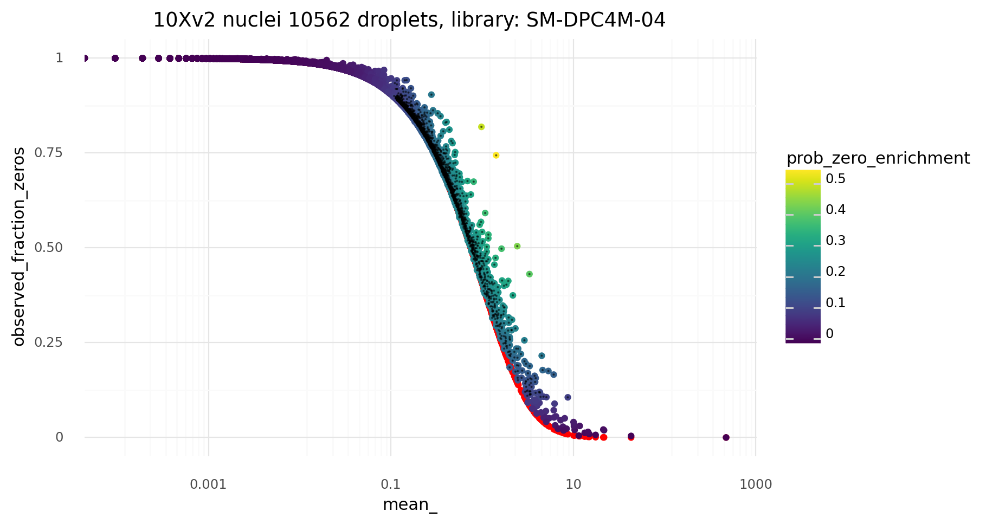

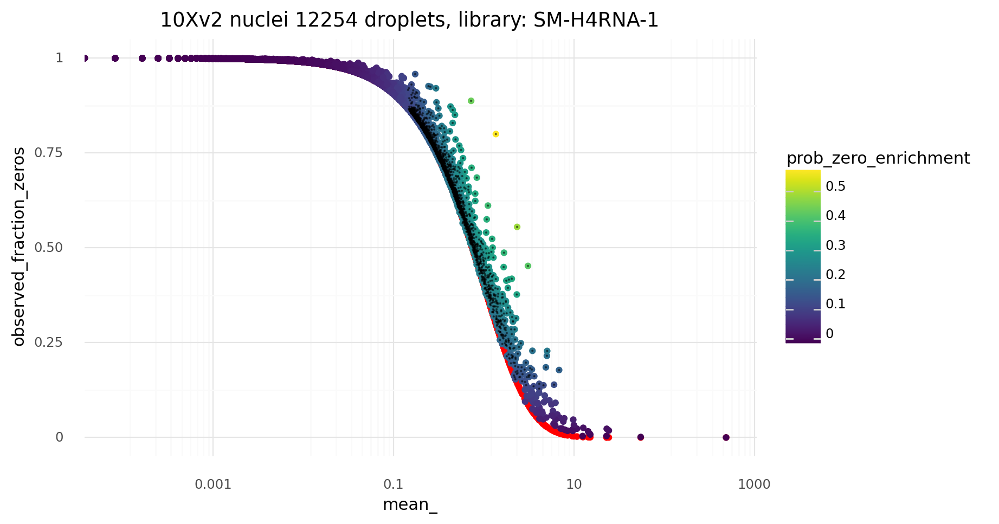

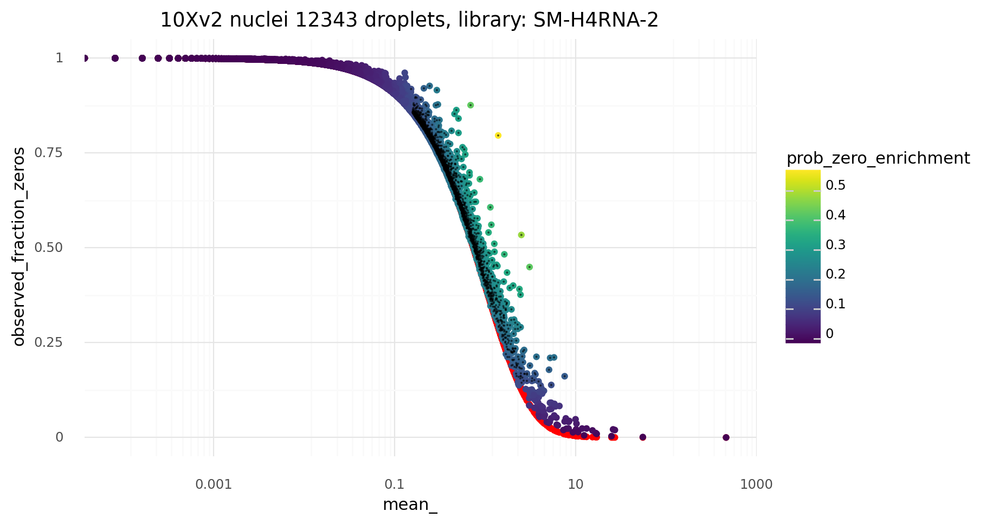

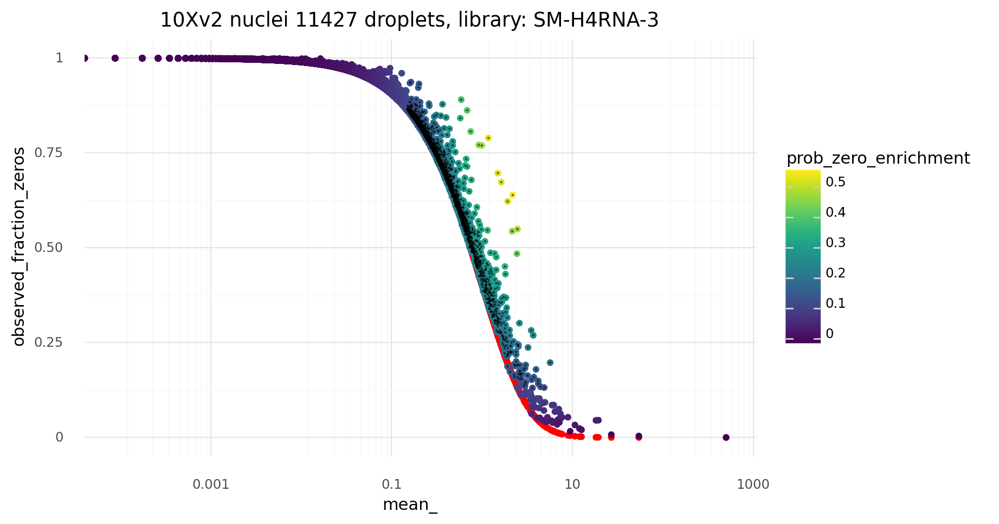

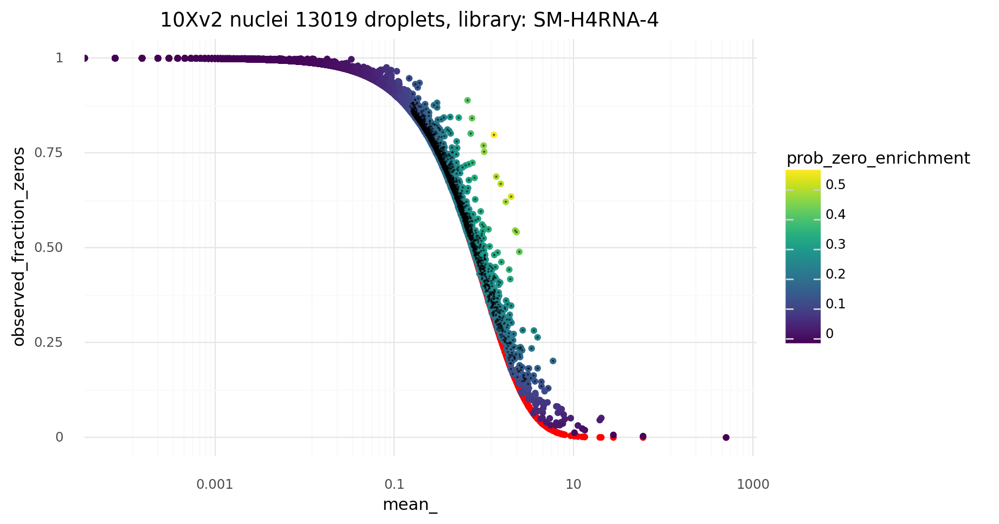

In [18]:
for  library_id in adata.obs.library_id.unique():

    ad = adata[adata.obs.library_id==library_id].copy()
    title=  ad.obs.method[0]+ ' ' + ad.obs.sample_type[0] + ' ' +str(len(ad)) + ' droplets, library: '+ library_id  
    print(f' ======================== {title} ==============================')

    scvi.data.poisson_gene_selection(ad, n_samples = 20000)

    df = ad.var

    df['mean_'] = np.array(ad.X.mean(0))[0]



    p.options.figure_size = (8, 5)
    pt=(
        p.ggplot(p.aes(x='mean_', y='observed_fraction_zeros', color='prob_zero_enrichment'), df)
        + p.geom_point(p.aes(y='expected_fraction_zeros'), color='r')
        + p.geom_point()
        + p.geom_point(data=df.query('highly_variable'), shape='.', size=0.2, color='k', alpha=0.5)
        + p.scale_x_log10()
        + p.theme_minimal()
        + p.labels.ggtitle(title)
    )
    pt.draw()